In [1740]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from dython.nominal import associations
from sklearn.metrics import confusion_matrix

# Data:

1. What does your data look like? 
2. What's the data size? How do you get training and testing set?
3. If it's classification, what is the class distribution (e.g., how many samples in each class). If it's regression, what is the regression value distribution (e.g., histogram of the values)
4. What's your feature space? How many features? What type of features? 
5. What data preprocessing steps you have done?

In [1741]:
# Read in given training testing datasets files
train_df = pd.read_csv("Train.csv", sep=",")
test_df = pd.read_csv("Test.csv", sep=",")

## Describing Data Before Cleaning

In [1742]:
# Check training and testing datasets' sample size
# Before cleaning, we have a total of 11 features. 8068 row of training data and 2627 rows of testing data
print(train_df.shape)
print(test_df.shape)

(8068, 11)
(2627, 11)


In [1743]:
train_df

,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,462809,Male,No,22,No,Healthcare,1.0,Low,4.0,Cat_4,D
1,462643,Female,Yes,38,Yes,Engineer,NaN,Average,3.0,Cat_4,A
2,466315,Female,Yes,67,Yes,Engineer,1.0,Low,1.0,Cat_6,B
3,461735,Male,Yes,67,Yes,Lawyer,0.0,High,2.0,Cat_6,B
4,462669,Female,Yes,40,Yes,Entertainment,NaN,High,6.0,Cat_6,A
...,...,...,...,...,...,...,...,...,...,...,...
8063,464018,Male,No,22,No,NaN,0.0,Low,7.0,Cat_1,D
8064,464685,Male,No,35,No,Executive,3.0,Low,4.0,Cat_4,D
8065,465406,Female,No,33,Yes,Healthcare,1.0,Low,1.0,Cat_6,D
8066,467299,Female,No,27,Yes,Healthcare,1.0,Low,4.0,Cat_6,B


In [1744]:
test_df

,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,458989,Female,Yes,36,Yes,Engineer,0.0,Low,1.0,Cat_6,B
1,458994,Male,Yes,37,Yes,Healthcare,8.0,Average,4.0,Cat_6,A
2,458996,Female,Yes,69,No,NaN,0.0,Low,1.0,Cat_6,A
3,459000,Male,Yes,59,No,Executive,11.0,High,2.0,Cat_6,B
4,459001,Female,No,19,No,Marketing,NaN,Low,4.0,Cat_6,A
...,...,...,...,...,...,...,...,...,...,...,...
2622,467954,Male,No,29,No,Healthcare,9.0,Low,4.0,Cat_6,B
2623,467958,Female,No,35,Yes,Doctor,1.0,Low,1.0,Cat_6,A
2624,467960,Female,No,53,Yes,Entertainment,NaN,Low,2.0,Cat_6,C
2625,467961,Male,Yes,47,Yes,Executive,1.0,High,5.0,Cat_4,C


## Dealing with Missing Values

### For training data set:

In [1745]:
# Check the number of rows containing empty values
null_sum = train_df.isnull().sum()
null_sum

ID                   0
Gender               0
Ever_Married       140
Age                  0
Graduated           78
Profession         124
Work_Experience    829
Spending_Score       0
Family_Size        335
Var_1               76
Segmentation         0
dtype: int64

Considering the large amount of rows containing empty data, we don't want to drop every row with empty data as doing so could hinder the accuracy of prediction.

For rows missing numerical values (work experience and family size, around 1000 samples), we will fill them with the average value.

For rows missing categorical values (ever_married, graduated, profession, around 300 samples), we will drop them.

In [1746]:
#replacing missing values with the average value for numerical variables
train_df["Work_Experience"].fillna(train_df["Work_Experience"].mean(), inplace = True)
train_df["Family_Size"].fillna(train_df["Family_Size"].mean(), inplace = True)

#dropping missing values left
train_df.dropna(axis=0, inplace=True)

In [1747]:
# Verify that we don't have missing values
train_df.isnull().sum()

ID                 0
Gender             0
Ever_Married       0
Age                0
Graduated          0
Profession         0
Work_Experience    0
Spending_Score     0
Family_Size        0
Var_1              0
Segmentation       0
dtype: int64

In [1748]:
# Reset index for join functions later
train_df.reset_index(drop=True, inplace=True)

### Repeating the steps for testing data set

In [1749]:
# Check the number of rows containing empty values
null_sum = test_df.isnull().sum()
null_sum

ID                   0
Gender               0
Ever_Married        50
Age                  0
Graduated           24
Profession          38
Work_Experience    269
Spending_Score       0
Family_Size        113
Var_1               32
Segmentation         0
dtype: int64

Similarly, considering the large amount of rows containing empty data, we don't want to drop every row with empty data as doing so could hinder the accuracy of prediction

For rows missing numerical values (around 1400 rows), we will fill them with the average value.

For rows missing categorical values (around 130 rows), we will drop them.

In [1750]:
#replacing missing values with the average value for numerical variables
test_df["Work_Experience"].fillna(test_df["Work_Experience"].mean(), inplace = True)
test_df["Family_Size"].fillna(test_df["Family_Size"].mean(), inplace = True)

#dropping missing values left
test_df.dropna(axis=0, inplace=True)

In [1751]:
# Verify that we don't have missing values
test_df.isnull().sum()

ID                 0
Gender             0
Ever_Married       0
Age                0
Graduated          0
Profession         0
Work_Experience    0
Spending_Score     0
Family_Size        0
Var_1              0
Segmentation       0
dtype: int64

In [1752]:
# Reset index for join functions later
test_df.reset_index(drop=True, inplace=True)

## Converting column data types

In [1753]:
#Since ID is unque for each customer so it will be useless as it cannot represent a class of samples. Drop the id column.
train_df = train_df.drop('ID', axis = 1)
test_df = test_df.drop('ID', axis = 1)

### Training data set

In [1754]:
#check original data types for each column in the training data set
train_df.dtypes

Gender              object
Ever_Married        object
Age                  int64
Graduated           object
Profession          object
Work_Experience    float64
Spending_Score      object
Family_Size        float64
Var_1               object
Segmentation        object
dtype: object

In [1755]:
# Convert columns containing categorical data to correct categorical data types
# Keep the segmentation column unchange because this is the ground truth
cat_col = ['Gender', 'Ever_Married', 'Graduated', 'Profession', 'Spending_Score', 'Var_1', 'Segmentation']
train_df[cat_col] = train_df[cat_col].astype('category')
train_df[cat_col]

,Gender,Ever_Married,Graduated,Profession,Spending_Score,Var_1,Segmentation
0,Male,No,No,Healthcare,Low,Cat_4,D
1,Female,Yes,Yes,Engineer,Average,Cat_4,A
2,Female,Yes,Yes,Engineer,Low,Cat_6,B
3,Male,Yes,Yes,Lawyer,High,Cat_6,B
4,Female,Yes,Yes,Entertainment,High,Cat_6,A
...,...,...,...,...,...,...,...
7664,Male,Yes,Yes,Artist,High,Cat_6,B
7665,Male,No,No,Executive,Low,Cat_4,D
7666,Female,No,Yes,Healthcare,Low,Cat_6,D
7667,Female,No,Yes,Healthcare,Low,Cat_6,B


In [1756]:
# Check if all categorical columns are converted
train_df[cat_col].dtypes

Gender            category
Ever_Married      category
Graduated         category
Profession        category
Spending_Score    category
Var_1             category
Segmentation      category
dtype: object

### Testing Dataset:

In [1757]:
#check original data types for each column in the training data set
test_df.dtypes

Gender              object
Ever_Married        object
Age                  int64
Graduated           object
Profession          object
Work_Experience    float64
Spending_Score      object
Family_Size        float64
Var_1               object
Segmentation        object
dtype: object

In [1758]:
# Convert columns containing categorical data to correct categorical data types
# Keep the segmentation column unchange because this is the ground truth
test_df[cat_col] = test_df[cat_col].astype('category')
test_df[cat_col]

,Gender,Ever_Married,Graduated,Profession,Spending_Score,Var_1,Segmentation
0,Female,Yes,Yes,Engineer,Low,Cat_6,B
1,Male,Yes,Yes,Healthcare,Average,Cat_6,A
2,Male,Yes,No,Executive,High,Cat_6,B
3,Female,No,No,Marketing,Low,Cat_6,A
4,Male,Yes,Yes,Doctor,High,Cat_4,C
...,...,...,...,...,...,...,...
2483,Male,No,No,Healthcare,Low,Cat_6,B
2484,Female,No,Yes,Doctor,Low,Cat_6,A
2485,Female,No,Yes,Entertainment,Low,Cat_6,C
2486,Male,Yes,Yes,Executive,High,Cat_4,C


In [1759]:
# Check if all categorical columns are converted
test_df[cat_col].dtypes

Gender            category
Ever_Married      category
Graduated         category
Profession        category
Spending_Score    category
Var_1             category
Segmentation      category
dtype: object

## Checking for outliers in categorical columns

Male      4217
Female    3452
Name: Gender, dtype: int64


<AxesSubplot:ylabel='Gender'>

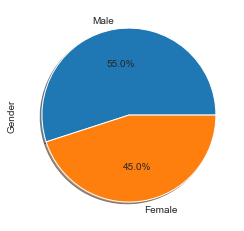

In [1760]:
# From the pie chart we can clearly see no outliers for gender categorical training samples
print(train_df['Gender'].value_counts())
train_df['Gender'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,textprops={"fontsize": 10})

Male      1352
Female    1136
Name: Gender, dtype: int64


<AxesSubplot:ylabel='Gender'>

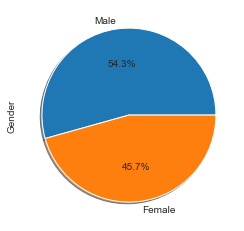

In [1761]:
# From the pie chart we can clearly see no outliers for gender categorical testing samples
print(test_df['Gender'].value_counts())
test_df['Gender'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,textprops={"fontsize": 10})

Yes    4492
No     3177
Name: Ever_Married, dtype: int64


<AxesSubplot:ylabel='Ever_Married'>

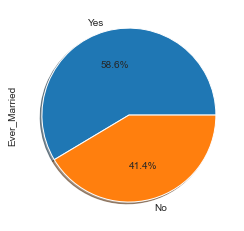

In [1762]:
# From the pie chart we can clearly see no outliers for Ever_Married categorical training samples
print(train_df['Ever_Married'].value_counts())
train_df['Ever_Married'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,textprops={"fontsize": 10})

Yes    1465
No     1023
Name: Ever_Married, dtype: int64


<AxesSubplot:ylabel='Ever_Married'>

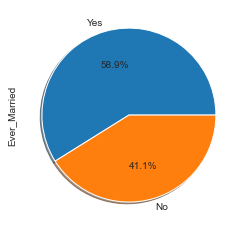

In [1763]:
# From the pie chart we can clearly see no outliers for Ever_Married categorical testing samples
print(test_df['Ever_Married'].value_counts())
test_df['Ever_Married'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,textprops={"fontsize": 10})

Yes    4813
No     2856
Name: Graduated, dtype: int64


/Users/violethuang/opt/anaconda3/lib/python3.9/site-packages/IPython/core/displayhook.py:275: UserWarning: Output cache limit (currently 1000 entries) hit.
Flushing oldest 200 entries.
  warn('Output cache limit (currently {sz} entries) hit.\n'


<AxesSubplot:ylabel='Graduated'>

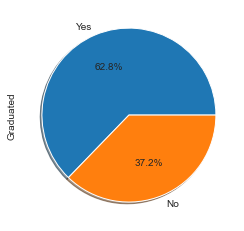

In [1764]:
# From the pie chart we can clearly see no outliers for Graduated categorical training samples
print(train_df['Graduated'].value_counts())
train_df['Graduated'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,textprops={"fontsize": 10})

Yes    1542
No      946
Name: Graduated, dtype: int64


<AxesSubplot:ylabel='Graduated'>

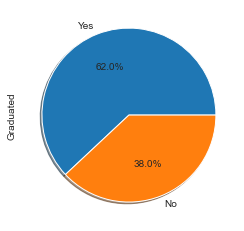

In [1765]:
# From the pie chart we can clearly see no outliers for Graduated categorical testing samples
print(test_df['Graduated'].value_counts())
test_df['Graduated'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,textprops={"fontsize": 10})

Artist           2449
Healthcare       1271
Entertainment     919
Engineer          674
Doctor            668
Lawyer            598
Executive         578
Marketing         278
Homemaker         234
Name: Profession, dtype: int64


<AxesSubplot:ylabel='Profession'>

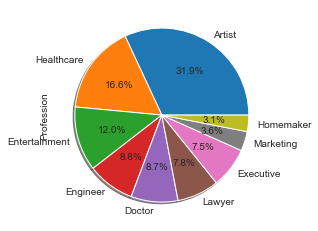

In [1766]:
# From each profession category count we conclude that there is not outlier since the least profession
# has a proportion of 3.1% and the count 234 is not extremely small compared to other professions
print(train_df['Profession'].value_counts())
train_df['Profession'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,textprops={"fontsize": 10})

Artist           775
Healthcare       397
Entertainment    292
Doctor           235
Engineer         227
Lawyer           210
Executive        169
Marketing        107
Homemaker         76
Name: Profession, dtype: int64


<AxesSubplot:ylabel='Profession'>

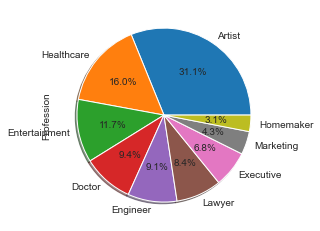

In [1767]:
# From each profession category count we conclude that there is not outlier since the least profession
# has a proportion of 3.1% and the count 76 is not extremely small compared to other professions
print(test_df['Profession'].value_counts())
test_df['Profession'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,textprops={"fontsize": 10})

Low        4645
Average    1873
High       1151
Name: Spending_Score, dtype: int64


<AxesSubplot:ylabel='Spending_Score'>

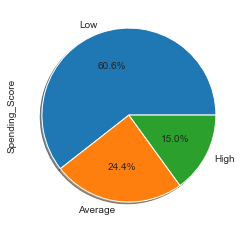

In [1768]:
# From the pie chart we can clearly see no outliers for Spending_Score categorical training samples
print(train_df['Spending_Score'].value_counts())
train_df['Spending_Score'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,textprops={"fontsize": 10})

Low        1536
Average     588
High        364
Name: Spending_Score, dtype: int64


<AxesSubplot:ylabel='Spending_Score'>

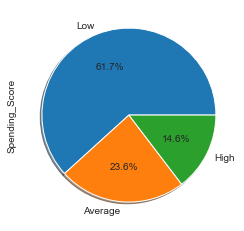

In [1769]:
# From the pie chart we can clearly see no outliers for Spending_Score categorical testing samples
print(test_df['Spending_Score'].value_counts())
test_df['Spending_Score'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,textprops={"fontsize": 10})

Cat_6    5088
Cat_4    1015
Cat_3     761
Cat_2     405
Cat_7     192
Cat_1     127
Cat_5      81
Name: Var_1, dtype: int64


<AxesSubplot:ylabel='Var_1'>

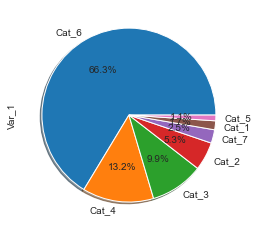

In [1770]:
# We can clearly observe from counts and pie chart that there is no outlier, because the smallest one is 81,
# which is not extremely small compared to the rest
print(train_df['Var_1'].value_counts())
train_df['Var_1'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,textprops={"fontsize": 10})

Cat_6    1622
Cat_4     365
Cat_3     244
Cat_2     133
Cat_7      63
Cat_1      33
Cat_5      28
Name: Var_1, dtype: int64


<AxesSubplot:ylabel='Var_1'>

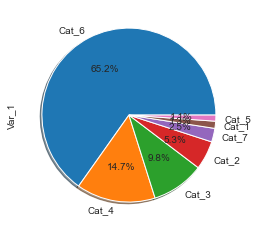

In [1771]:
# We can clearly observe from counts and pie chart that there is no outlier, because the smallest one is 28,
# which is not extremely small compared to the rest
print(test_df['Var_1'].value_counts())
test_df['Var_1'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,textprops={"fontsize": 10})

D    2127
C    1896
A    1867
B    1779
Name: Segmentation, dtype: int64


<AxesSubplot:ylabel='Segmentation'>

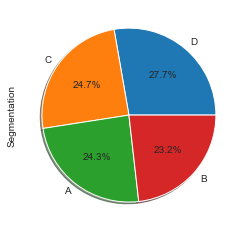

In [1772]:
# We can clearly observe from the counts and bar charts that there is no outlier
print(train_df['Segmentation'].value_counts())

train_df['Segmentation'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,textprops={"fontsize": 10})

A    794
D    726
B    523
C    445
Name: Segmentation, dtype: int64


<AxesSubplot:ylabel='Segmentation'>

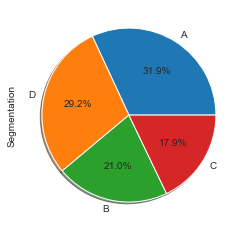

In [1773]:
# We can clearly observe from the counts and bar charts that there is no outlier
print(test_df['Segmentation'].value_counts())
test_df['Segmentation'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,textprops={"fontsize": 10})

In summery, we can see that none of the categorical columns have outliers.

By comparing the pie charts of testing and training data, we can see that their distribution are similar for all categorical values except the segmentation column.

This could mean our models may not predict as accurately on the testing datset as a dataset where distribution of the segmentation column are similar

## Featuring Engineering for Categorical Data

In [1774]:
#import relevant package
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder(handle_unknown='ignore')

In [1775]:
# Since gender category only has 2 possible value male and female
# instead of using string to represent we use 0 and 1. 0 means male and 1 means female
scale_mapper = {"Male":0, "Female":1}
train_df["Gender"] = train_df["Gender"].replace(scale_mapper)
train_df

,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,0,No,22,No,Healthcare,1.000000,Low,4.0,Cat_4,D
1,1,Yes,38,Yes,Engineer,2.641663,Average,3.0,Cat_4,A
2,1,Yes,67,Yes,Engineer,1.000000,Low,1.0,Cat_6,B
3,0,Yes,67,Yes,Lawyer,0.000000,High,2.0,Cat_6,B
4,1,Yes,40,Yes,Entertainment,2.641663,High,6.0,Cat_6,A
...,...,...,...,...,...,...,...,...,...,...
7664,0,Yes,41,Yes,Artist,0.000000,High,5.0,Cat_6,B
7665,0,No,35,No,Executive,3.000000,Low,4.0,Cat_4,D
7666,1,No,33,Yes,Healthcare,1.000000,Low,1.0,Cat_6,D
7667,1,No,27,Yes,Healthcare,1.000000,Low,4.0,Cat_6,B


In [1776]:
#Repeat the step for testing data set
test_df["Gender"] = test_df["Gender"].replace(scale_mapper)
test_df

,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,1,Yes,36,Yes,Engineer,0.000000,Low,1.0,Cat_6,B
1,0,Yes,37,Yes,Healthcare,8.000000,Average,4.0,Cat_6,A
2,0,Yes,59,No,Executive,11.000000,High,2.0,Cat_6,B
3,1,No,19,No,Marketing,2.552587,Low,4.0,Cat_6,A
4,0,Yes,47,Yes,Doctor,0.000000,High,5.0,Cat_4,C
...,...,...,...,...,...,...,...,...,...,...
2483,0,No,29,No,Healthcare,9.000000,Low,4.0,Cat_6,B
2484,1,No,35,Yes,Doctor,1.000000,Low,1.0,Cat_6,A
2485,1,No,53,Yes,Entertainment,2.552587,Low,2.0,Cat_6,C
2486,0,Yes,47,Yes,Executive,1.000000,High,5.0,Cat_4,C


In [1777]:
# Since Ever_Married category only has 2 possible value Yes and No, 
# instead of using string to represent we use 0 and 1, 0 means no and 1 means yes
scale_mapper = {"No":0, "Yes":1}
train_df["Ever_Married"] = train_df["Ever_Married"].replace(scale_mapper)
train_df

,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,0,0,22,No,Healthcare,1.000000,Low,4.0,Cat_4,D
1,1,1,38,Yes,Engineer,2.641663,Average,3.0,Cat_4,A
2,1,1,67,Yes,Engineer,1.000000,Low,1.0,Cat_6,B
3,0,1,67,Yes,Lawyer,0.000000,High,2.0,Cat_6,B
4,1,1,40,Yes,Entertainment,2.641663,High,6.0,Cat_6,A
...,...,...,...,...,...,...,...,...,...,...
7664,0,1,41,Yes,Artist,0.000000,High,5.0,Cat_6,B
7665,0,0,35,No,Executive,3.000000,Low,4.0,Cat_4,D
7666,1,0,33,Yes,Healthcare,1.000000,Low,1.0,Cat_6,D
7667,1,0,27,Yes,Healthcare,1.000000,Low,4.0,Cat_6,B


In [1778]:
#Repeating the step for testing data set
test_df["Ever_Married"] = test_df["Ever_Married"].replace(scale_mapper)
test_df

,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,1,1,36,Yes,Engineer,0.000000,Low,1.0,Cat_6,B
1,0,1,37,Yes,Healthcare,8.000000,Average,4.0,Cat_6,A
2,0,1,59,No,Executive,11.000000,High,2.0,Cat_6,B
3,1,0,19,No,Marketing,2.552587,Low,4.0,Cat_6,A
4,0,1,47,Yes,Doctor,0.000000,High,5.0,Cat_4,C
...,...,...,...,...,...,...,...,...,...,...
2483,0,0,29,No,Healthcare,9.000000,Low,4.0,Cat_6,B
2484,1,0,35,Yes,Doctor,1.000000,Low,1.0,Cat_6,A
2485,1,0,53,Yes,Entertainment,2.552587,Low,2.0,Cat_6,C
2486,0,1,47,Yes,Executive,1.000000,High,5.0,Cat_4,C


In [1779]:
# Since Graduated category only has 2 possible value Yes and No, 
# instead of using string to represent we use 0 and 1, 0 means no and 1 means yes
scale_mapper = {"No":0, "Yes":1}
train_df["Graduated"] = train_df["Graduated"].replace(scale_mapper)
train_df

,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,0,0,22,0,Healthcare,1.000000,Low,4.0,Cat_4,D
1,1,1,38,1,Engineer,2.641663,Average,3.0,Cat_4,A
2,1,1,67,1,Engineer,1.000000,Low,1.0,Cat_6,B
3,0,1,67,1,Lawyer,0.000000,High,2.0,Cat_6,B
4,1,1,40,1,Entertainment,2.641663,High,6.0,Cat_6,A
...,...,...,...,...,...,...,...,...,...,...
7664,0,1,41,1,Artist,0.000000,High,5.0,Cat_6,B
7665,0,0,35,0,Executive,3.000000,Low,4.0,Cat_4,D
7666,1,0,33,1,Healthcare,1.000000,Low,1.0,Cat_6,D
7667,1,0,27,1,Healthcare,1.000000,Low,4.0,Cat_6,B


In [1780]:
# Repeating the step for testing data set
test_df["Graduated"] = test_df["Graduated"].replace(scale_mapper)
test_df

,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation
0,1,1,36,1,Engineer,0.000000,Low,1.0,Cat_6,B
1,0,1,37,1,Healthcare,8.000000,Average,4.0,Cat_6,A
2,0,1,59,0,Executive,11.000000,High,2.0,Cat_6,B
3,1,0,19,0,Marketing,2.552587,Low,4.0,Cat_6,A
4,0,1,47,1,Doctor,0.000000,High,5.0,Cat_4,C
...,...,...,...,...,...,...,...,...,...,...
2483,0,0,29,0,Healthcare,9.000000,Low,4.0,Cat_6,B
2484,1,0,35,1,Doctor,1.000000,Low,1.0,Cat_6,A
2485,1,0,53,1,Entertainment,2.552587,Low,2.0,Cat_6,C
2486,0,1,47,1,Executive,1.000000,High,5.0,Cat_4,C


In [1781]:
# One hot encoding Profession category for training data
ohe.fit(train_df[['Profession']])
ohe.transform(train_df[['Profession']]).toarray()[0]
new = pd.DataFrame(ohe.transform(train_df[['Profession']]).toarray()).rename(columns={i: catg for i, catg in enumerate(ohe.categories_[0])})
train_df = train_df.join(new)

In [1782]:
# One hot encoding Profession category for testing data
ohe.fit(test_df[['Profession']])
ohe.transform(test_df[['Profession']]).toarray()[0]
new = pd.DataFrame(ohe.transform(test_df[['Profession']]).toarray()).rename(columns={i: catg for i, catg in enumerate(ohe.categories_[0])})
test_df = test_df.join(new)

In [1783]:
# One hot encoding Var_1 category for training data
ohe.fit(train_df[['Var_1']])
ohe.transform(train_df[['Var_1']]).toarray()[0]
new = pd.DataFrame(ohe.transform(train_df[['Var_1']]).toarray()).rename(columns={i: catg for i, catg in enumerate(ohe.categories_[0])})
train_df = train_df.join(new)

In [1784]:
# One hot encoding Var_1 category for testing data
ohe.fit(test_df[['Var_1']])
ohe.transform(test_df[['Var_1']]).toarray()[0]
new = pd.DataFrame(ohe.transform(test_df[['Var_1']]).toarray()).rename(columns={i: catg for i, catg in enumerate(ohe.categories_[0])})
test_df = test_df.join(new)

In [1785]:
# Label encoding Segmentation category for training data, 
# using numerical 0, 1, 2, 3 to represent A, B, C, D instead of string
scale_mapper = {"A":0, "B":1, "C":2, "D":3}
train_df["Segmentation"] = train_df["Segmentation"].replace(scale_mapper)
train_df

,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation,...,Homemaker,Lawyer,Marketing,Cat_1,Cat_2,Cat_3,Cat_4,Cat_5,Cat_6,Cat_7
0,0,0,22,0,Healthcare,1.000000,Low,4.0,Cat_4,3,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1,1,38,1,Engineer,2.641663,Average,3.0,Cat_4,0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,1,1,67,1,Engineer,1.000000,Low,1.0,Cat_6,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0,1,67,1,Lawyer,0.000000,High,2.0,Cat_6,1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1,1,40,1,Entertainment,2.641663,High,6.0,Cat_6,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7664,0,1,41,1,Artist,0.000000,High,5.0,Cat_6,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
7665,0,0,35,0,Executive,3.000000,Low,4.0,Cat_4,3,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7666,1,0,33,1,Healthcare,1.000000,Low,1.0,Cat_6,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
7667,1,0,27,1,Healthcare,1.000000,Low,4.0,Cat_6,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [1786]:
# Label encoding Segmentation category for testing data, 
# using numerical 0, 1, 2, 3 to represent A, B, C, D instead of string
test_df["Segmentation"] = test_df["Segmentation"].replace(scale_mapper)
test_df

,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation,...,Homemaker,Lawyer,Marketing,Cat_1,Cat_2,Cat_3,Cat_4,Cat_5,Cat_6,Cat_7
0,1,1,36,1,Engineer,0.000000,Low,1.0,Cat_6,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0,1,37,1,Healthcare,8.000000,Average,4.0,Cat_6,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0,1,59,0,Executive,11.000000,High,2.0,Cat_6,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1,0,19,0,Marketing,2.552587,Low,4.0,Cat_6,0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0,1,47,1,Doctor,0.000000,High,5.0,Cat_4,2,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2483,0,0,29,0,Healthcare,9.000000,Low,4.0,Cat_6,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2484,1,0,35,1,Doctor,1.000000,Low,1.0,Cat_6,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2485,1,0,53,1,Entertainment,2.552587,Low,2.0,Cat_6,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2486,0,1,47,1,Executive,1.000000,High,5.0,Cat_4,2,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [1787]:
# Ordinal Encoding Spending Score since it has natural ordering low average high, 0 means low, 1 means average, 2 means high
scale_mapper = {"Low":0, "Average":1, "High":2}
train_df["Spending_Score"] = train_df["Spending_Score"].replace(scale_mapper)
train_df

,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation,...,Homemaker,Lawyer,Marketing,Cat_1,Cat_2,Cat_3,Cat_4,Cat_5,Cat_6,Cat_7
0,0,0,22,0,Healthcare,1.000000,0,4.0,Cat_4,3,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1,1,38,1,Engineer,2.641663,1,3.0,Cat_4,0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,1,1,67,1,Engineer,1.000000,0,1.0,Cat_6,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0,1,67,1,Lawyer,0.000000,2,2.0,Cat_6,1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1,1,40,1,Entertainment,2.641663,2,6.0,Cat_6,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7664,0,1,41,1,Artist,0.000000,2,5.0,Cat_6,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
7665,0,0,35,0,Executive,3.000000,0,4.0,Cat_4,3,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7666,1,0,33,1,Healthcare,1.000000,0,1.0,Cat_6,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
7667,1,0,27,1,Healthcare,1.000000,0,4.0,Cat_6,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [1788]:
#Repeat the step for testing data set
test_df["Spending_Score"] = test_df["Spending_Score"].replace(scale_mapper)
test_df

,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size,Var_1,Segmentation,...,Homemaker,Lawyer,Marketing,Cat_1,Cat_2,Cat_3,Cat_4,Cat_5,Cat_6,Cat_7
0,1,1,36,1,Engineer,0.000000,0,1.0,Cat_6,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0,1,37,1,Healthcare,8.000000,1,4.0,Cat_6,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0,1,59,0,Executive,11.000000,2,2.0,Cat_6,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1,0,19,0,Marketing,2.552587,0,4.0,Cat_6,0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0,1,47,1,Doctor,0.000000,2,5.0,Cat_4,2,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2483,0,0,29,0,Healthcare,9.000000,0,4.0,Cat_6,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2484,1,0,35,1,Doctor,1.000000,0,1.0,Cat_6,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2485,1,0,53,1,Entertainment,2.552587,0,2.0,Cat_6,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2486,0,1,47,1,Executive,1.000000,2,5.0,Cat_4,2,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


## Processing Numerical Data

In [1789]:
# Previously, we used the mean to fill missing values in the Work_Experience and Family_Size columns, 
# which changes their data types to float
# We change their data types back to int by rounding the numbers to nearest integer and setting them as columns with data type int
num_col = ['Age', 'Work_Experience', 'Family_Size']
train_df[num_col] = np.rint(train_df[num_col]).astype(int)
train_df[num_col]

,Age,Work_Experience,Family_Size
0,22,1,4
1,38,3,3
2,67,1,1
3,67,0,2
4,40,3,6
...,...,...,...
7664,41,0,5
7665,35,3,4
7666,33,1,1
7667,27,1,4


In [1790]:
train_df[num_col].dtypes

Age                int64
Work_Experience    int64
Family_Size        int64
dtype: object

In [1791]:
# # Repeating the steps for testing data
test_df[num_col] = np.rint(test_df[num_col]).astype(int)
test_df[num_col]

,Age,Work_Experience,Family_Size
0,36,0,1
1,37,8,4
2,59,11,2
3,19,3,4
4,47,0,5
...,...,...,...
2483,29,9,4
2484,35,1,1
2485,53,3,2
2486,47,1,5


In [1792]:
test_df[num_col].dtypes

Age                int64
Work_Experience    int64
Family_Size        int64
dtype: object

## Check for Outliers in Numerical Columns

<AxesSubplot:xlabel='Age'>

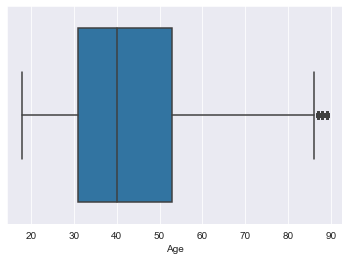

In [1793]:
# Print the boxplot of Age column for training data set to check for outliers
sns.set_style("darkgrid",{'axes.grid' : True})
sns.boxplot(x=train_df['Age'], orient='h')

In [1794]:
# Calculate the Q1, Q3, lower threshold and upper threshold of Age column for training data
Q1 = train_df['Age'].quantile(0.25)
Q3 = train_df['Age'].quantile(0.75)
IQR = Q3 - Q1
lower_thresh = Q1 - 1.5*IQR
upper_thresh = Q3 + 1.5*IQR
Q1, Q3, lower_thresh, upper_thresh

(31.0, 53.0, -2.0, 86.0)

In [1795]:
#droping rows where values in the Age column is larger than the upper throshold and smaller than 0
print("Data size before dropping:", train_df.shape)
train_df.drop(train_df[train_df['Age'] > 86].index, inplace=True)
train_df.drop(train_df[train_df['Age'] < 0].index, inplace=True)
print("Data size after dropping:", train_df.shape)

Data size before dropping: (7669, 26)
Data size after dropping: (7574, 26)


<AxesSubplot:xlabel='Age'>

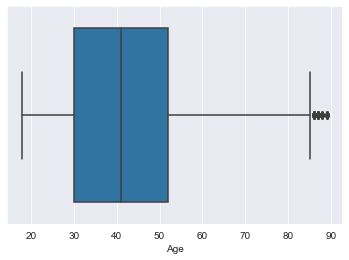

In [1796]:
# Print the boxplot of Age column for testing data set to check for outliers
sns.boxplot(x=test_df['Age'], orient='h')

In [1797]:
# Calculate the Q1, Q3, lower threshold and upper threshold of Age column for testing data
Q1 = test_df['Age'].quantile(0.25)
Q3 = test_df['Age'].quantile(0.75)
IQR = Q3 - Q1
lower_thresh = Q1 - 1.5*IQR
upper_thresh = Q3 + 1.5*IQR
Q1, Q3, lower_thresh, upper_thresh

(30.0, 52.0, -3.0, 85.0)

In [1798]:
#droping rows where values in the Age column is larger than the upper throshold and smaller than 0
print("Data size before dropping:", test_df.shape)
test_df.drop(test_df[test_df['Age'] > 85].index, inplace=True)
test_df.drop(test_df[test_df['Age'] < 0].index, inplace=True)
print("Data size after dropping:", test_df.shape)

Data size before dropping: (2488, 26)
Data size after dropping: (2441, 26)


<AxesSubplot:xlabel='Work_Experience'>

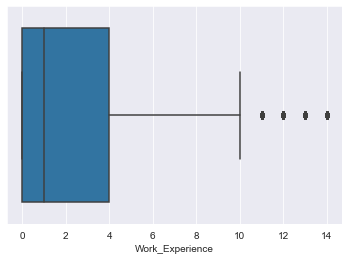

In [1799]:
# Print the boxplot of Work_Experience column for training data set to check for outliers
sns.boxplot(x=train_df['Work_Experience'], orient='h')

In [1800]:
# Calculate the Q1, Q3, lower threshold and upper threshold of Work_Experience column for training data
Q1 = train_df['Work_Experience'].quantile(0.25)
Q3 = train_df['Work_Experience'].quantile(0.75)
IQR = Q3 - Q1
lower_thresh = Q1 - 1.5*IQR
upper_thresh = Q3 + 1.5*IQR
Q1, Q3, lower_thresh, upper_thresh

(0.0, 4.0, -6.0, 10.0)

In [1801]:
#droping rows where values in the Work_Experience column is larger than the upper throshold and smaller than 0
print("Data size before dropping:", train_df.shape)
train_df.drop(train_df[train_df['Work_Experience'] > 10].index, inplace=True)
train_df.drop(train_df[train_df['Work_Experience'] < 0].index, inplace=True)
print("Data size after dropping:", train_df.shape)

Data size before dropping: (7574, 26)
Data size after dropping: (7392, 26)


<AxesSubplot:xlabel='Work_Experience'>

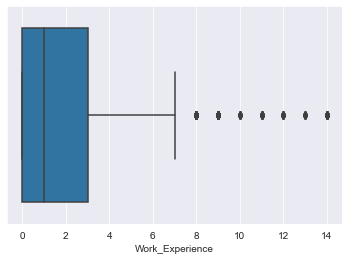

In [1802]:
# Print the boxplot of Work_Experience column for testing data set to check for outliers
sns.boxplot(x=test_df['Work_Experience'], orient='h')

In [1803]:
# Calculate the Q1, Q3, lower threshold and upper threshold of Work_Experience column for testing data
Q1 = test_df['Work_Experience'].quantile(0.25)
Q3 = test_df['Work_Experience'].quantile(0.75)
IQR = Q3 - Q1
lower_thresh = Q1 - 1.5*IQR
upper_thresh = Q3 + 1.5*IQR
Q1, Q3, lower_thresh, upper_thresh

(0.0, 3.0, -4.5, 7.5)

In [1804]:
#droping rows where values in the Work_Experience column is larger than the upper throshold and smaller than 0
print("Data size before dropping:", test_df.shape)
test_df.drop(test_df[test_df['Work_Experience'] > 10].index, inplace=True)
test_df.drop(test_df[test_df['Work_Experience'] < 0].index, inplace=True)
print("Data size after dropping:", test_df.shape)

Data size before dropping: (2441, 26)
Data size after dropping: (2384, 26)


<AxesSubplot:xlabel='Family_Size'>

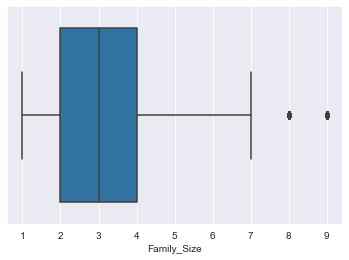

In [1805]:
# Print the boxplot of Family_Size column for training data set to check for outliers
sns.boxplot(x=train_df['Family_Size'], orient='h')

In [1806]:
# Calculate the Q1, Q3, lower threshold and upper threshold of Family_Size column for training data
Q1 = train_df['Family_Size'].quantile(0.25)
Q3 = train_df['Family_Size'].quantile(0.75)
IQR = Q3 - Q1
lower_thresh = Q1 - 1.5*IQR
upper_thresh = Q3 + 1.5*IQR
Q1, Q3, lower_thresh, upper_thresh

(2.0, 4.0, -1.0, 7.0)

In [1807]:
#droping rows where values in the Family_Size column is larger than the upper throshold and smaller than 0
print("Data size before dropping:", train_df.shape)
train_df.drop(train_df[train_df['Family_Size'] > 7].index, inplace=True)
train_df.drop(train_df[train_df['Family_Size'] < 0].index, inplace=True)
print("Data size after dropping:", train_df.shape)

Data size before dropping: (7392, 26)
Data size after dropping: (7308, 26)


<AxesSubplot:xlabel='Family_Size'>

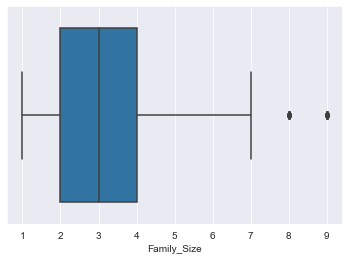

In [1808]:
# Print the boxplot of Family_Size column for testing data set to check for outliers
sns.boxplot(x=test_df['Family_Size'], orient='h')

In [1809]:
# Calculate the Q1, Q3, lower threshold and upper threshold of Family_Size column for testing data
Q1 = test_df['Family_Size'].quantile(0.25)
Q3 = test_df['Family_Size'].quantile(0.75)
IQR = Q3 - Q1
lower_thresh = Q1 - 1.5*IQR
upper_thresh = Q3 + 1.5*IQR
Q1, Q3, lower_thresh, upper_thresh

(2.0, 4.0, -1.0, 7.0)

In [1810]:
#droping rows where values in the Family_Size column is larger than the upper throshold and smaller than 0
print("Data size before dropping:", test_df.shape)
test_df.drop(test_df[test_df['Family_Size'] > 7].index, inplace=True)
test_df.drop(test_df[test_df['Family_Size'] < 0].index, inplace=True)
print("Data size after dropping:", test_df.shape)

Data size before dropping: (2384, 26)
Data size after dropping: (2355, 26)


## Normalizing Numerical Data

In [1811]:
#import relevant package
from sklearn.preprocessing import MinMaxScaler

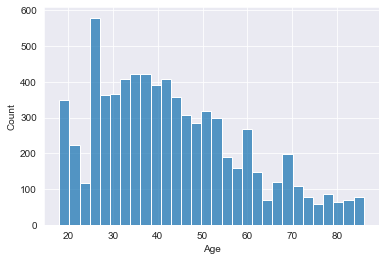

In [1812]:
# Normalize Age column for training data
sns.histplot(train_df['Age'])
scaler = MinMaxScaler(feature_range=(0,1))
train_df['Age_normalized'] = scaler.fit_transform(train_df[['Age']].values)

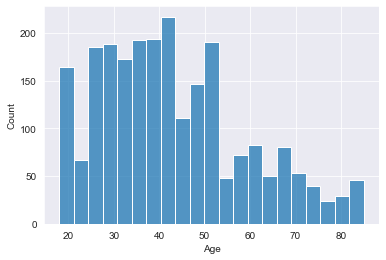

In [1813]:
# Normalize Age column for testing data
sns.histplot(test_df['Age'])
test_df['Age_normalized'] = scaler.fit_transform(test_df[['Age']].values)

<AxesSubplot:xlabel='Age_normalized', ylabel='Count'>

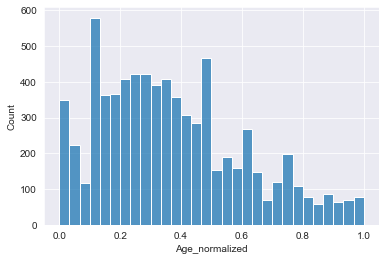

In [1814]:
# Visualize normalized Age column for training data
sns.histplot(train_df['Age_normalized'])

<AxesSubplot:xlabel='Age_normalized', ylabel='Count'>

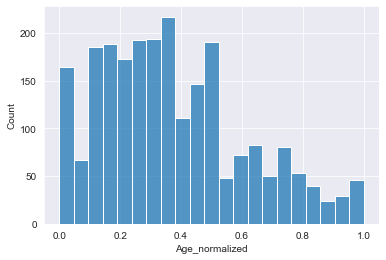

In [1815]:
# Visualize normalized Age column for testing data
sns.histplot(test_df['Age_normalized'])

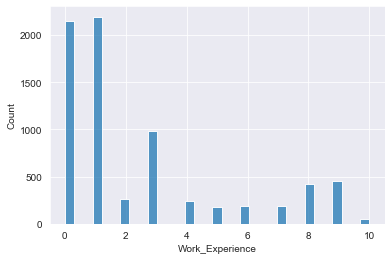

In [1816]:
# Normalize Work_Experience column for training data
sns.histplot(train_df['Work_Experience'])
train_df['Work_Experience_normalized'] = scaler.fit_transform(train_df[['Work_Experience']].values)

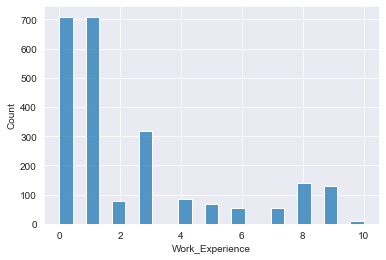

In [1817]:
# Normalize Work_Experience column for testing data
sns.histplot(test_df['Work_Experience'])
test_df['Work_Experience_normalized'] = scaler.fit_transform(test_df[['Work_Experience']].values)

<AxesSubplot:xlabel='Work_Experience_normalized', ylabel='Count'>

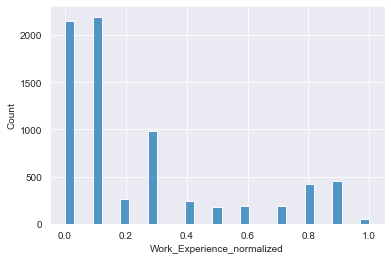

In [1818]:
# Visualize normalized Work_Experience column for training data
sns.histplot(train_df['Work_Experience_normalized'])

<AxesSubplot:xlabel='Work_Experience_normalized', ylabel='Count'>

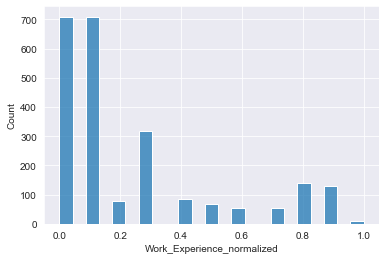

In [1819]:
# Visualize normalized Work_Experience column for testing data
sns.histplot(test_df['Work_Experience_normalized'])

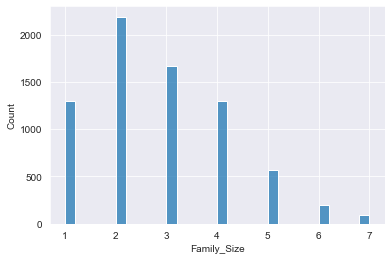

In [1820]:
# Normalize Family_Size column for training data
sns.histplot(train_df['Family_Size'])
train_df['Family_Size_normalized'] = scaler.fit_transform(train_df[['Family_Size']].values)

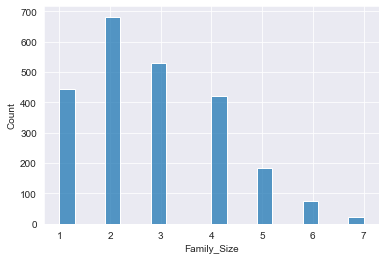

In [1821]:
# Normalize Family_Size column for testing data
sns.histplot(test_df['Family_Size'])
test_df['Family_Size_normalized'] = scaler.fit_transform(test_df[['Family_Size']].values)

<AxesSubplot:xlabel='Family_Size_normalized', ylabel='Count'>

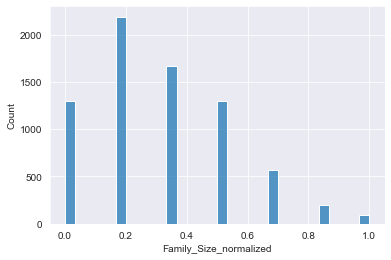

In [1822]:
# Visualize normalized Family_Size column for training data
sns.histplot(train_df['Family_Size_normalized'])

<AxesSubplot:xlabel='Family_Size_normalized', ylabel='Count'>

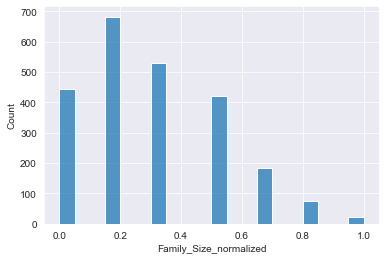

In [1823]:
# Visualize normalized Family_Size column for testing data
sns.histplot(test_df['Family_Size_normalized'])

In [1824]:
#Dropping the unnormalized columns in training and testing data sets
train_df = train_df.drop(['Profession', 'Var_1', 'Age', 'Work_Experience', 'Family_Size'], axis=1)
test_df = test_df.drop(['Profession', 'Var_1', 'Age', 'Work_Experience', 'Family_Size'], axis=1)

In [1825]:
# Reset the index for training and testing data set
train_df.reset_index(drop=True, inplace=True)
test_df.reset_index(drop=True, inplace=True)

In [1826]:
train_df

,Gender,Ever_Married,Graduated,Spending_Score,Segmentation,Artist,Doctor,Engineer,Entertainment,Executive,...,Cat_1,Cat_2,Cat_3,Cat_4,Cat_5,Cat_6,Cat_7,Age_normalized,Work_Experience_normalized,Family_Size_normalized
0,0,0,0,0,3,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.058824,0.1,0.500000
1,1,1,1,1,0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.294118,0.3,0.333333
2,1,1,1,0,1,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.720588,0.1,0.000000
3,0,1,1,2,1,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.720588,0.0,0.166667
4,1,1,1,2,0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.323529,0.3,0.833333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7303,0,1,1,2,1,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.338235,0.0,0.666667
7304,0,0,0,0,3,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.250000,0.3,0.500000
7305,1,0,1,0,3,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.220588,0.1,0.000000
7306,1,0,1,0,1,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.132353,0.1,0.500000


In [1827]:
test_df

,Gender,Ever_Married,Graduated,Spending_Score,Segmentation,Artist,Doctor,Engineer,Entertainment,Executive,...,Cat_1,Cat_2,Cat_3,Cat_4,Cat_5,Cat_6,Cat_7,Age_normalized,Work_Experience_normalized,Family_Size_normalized
0,1,1,1,0,1,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.268657,0.0,0.000000
1,0,1,1,1,0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.283582,0.8,0.500000
2,1,0,0,0,0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.014925,0.3,0.500000
3,0,1,1,2,2,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.432836,0.0,0.666667
4,0,1,1,0,3,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.641791,0.5,0.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2350,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.164179,0.9,0.500000
2351,1,0,1,0,0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.253731,0.1,0.000000
2352,1,0,1,0,2,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.522388,0.3,0.166667
2353,0,1,1,2,2,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.432836,0.1,0.666667


# Data Exploration

## Heat Map And Feature Selection

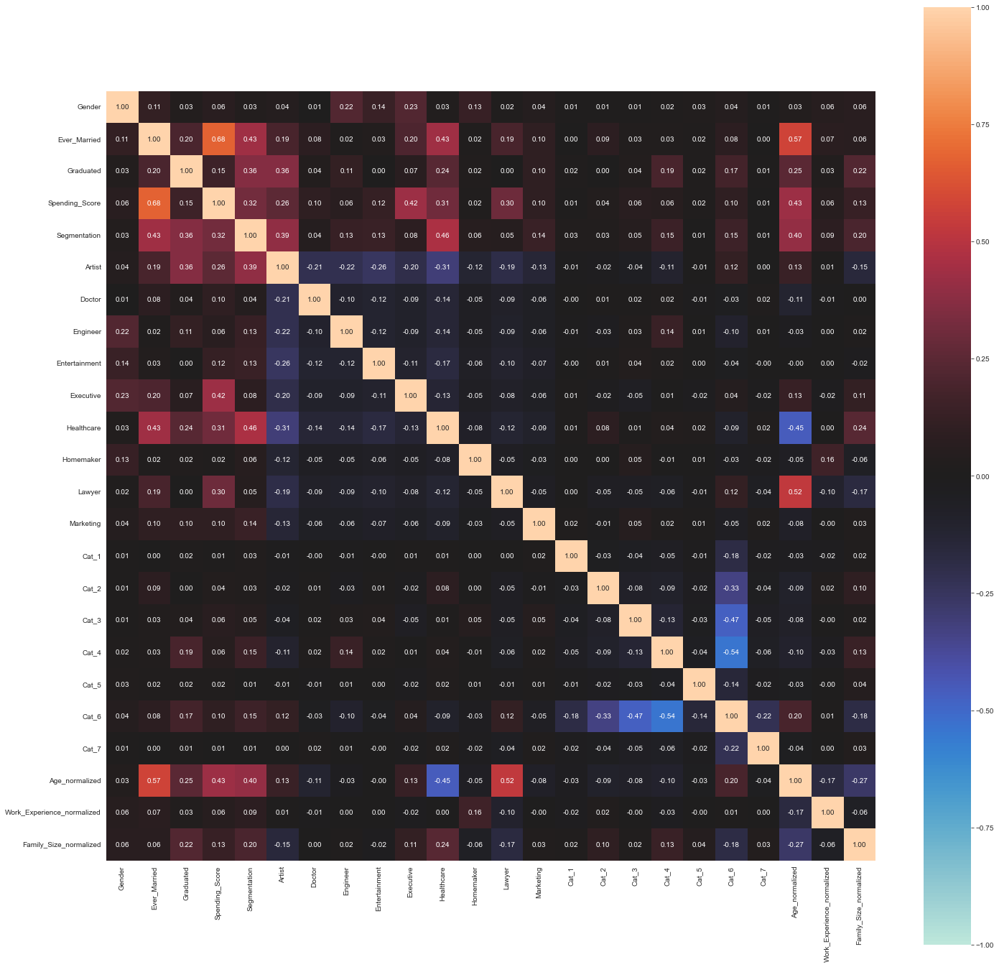

{'corr':                               Gender  Ever_Married  Graduated  Spending_Score  \
 Gender                      1.000000      0.113865   0.034626        0.063865   
 Ever_Married                0.113865      1.000000   0.198109        0.677835   
 Graduated                   0.034626      0.198109   1.000000        0.153223   
 Spending_Score              0.063865      0.677835   0.153223        1.000000   
 Segmentation                0.033863      0.430934   0.363655        0.318401   
 Artist                      0.044978      0.188158   0.363440        0.256819   
 Doctor                      0.006001      0.083078   0.038262        0.095814   
 Engineer                    0.219232      0.015784   0.111398        0.064224   
 Entertainment               0.139573      0.031623   0.002581        0.121298   
 Executive                   0.225157      0.203778   0.065165        0.423137   
 Healthcare                  0.030891      0.432201   0.238593        0.308926   
 Homemak

In [1828]:
# creating a heat map for all variables in the training data set
# None of the variables have correlation that exceeds 0.8, so we keep all variables
associations(train_df, nominal_columns=['Gender','Ever_Married', 'Graduated', 'Spending_Score', 'Segmentation'], figsize=(24,24))

# Exploring Variables with Relatively High Correlations

<AxesSubplot:xlabel='Spending_Score'>

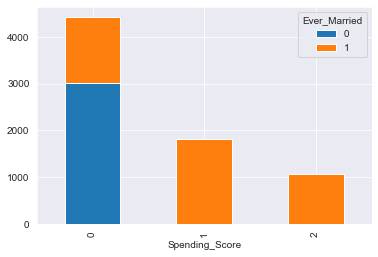

In [1829]:
# Plotting a stacked bar graph between spending_score and ever_married for training data set
# We could see that all of the customers who have not married concentrate have a low spending score
graph = pd.crosstab(train_df['Spending_Score'].astype('category').cat.reorder_categories([0,1,2]), train_df['Ever_Married'])
graph.plot(kind='bar', stacked=True, sort_columns=True)

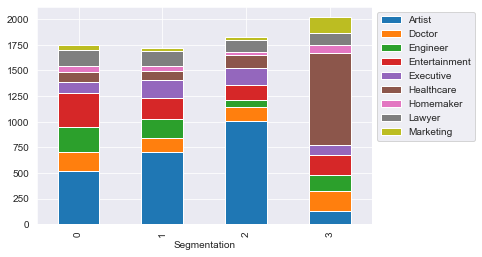

In [1830]:
# Plotting a stacked bar graph between professor and segmentation
# We can see  the number of artists drops in segmentation 3, whereas the number of healthcare workers increase in segmentation 3
train_df[['Segmentation', 'Artist', 'Doctor', 'Engineer', 'Entertainment', 'Executive', 'Healthcare', 'Homemaker', 'Lawyer', 'Marketing']]\
    .groupby('Segmentation').sum().plot(kind='bar', stacked=True)
plt.legend(bbox_to_anchor=(1.0,1.0))

# Model Requirement:
1. Which model(s) did you use
2. For each model, which parameter values did you tune (if you are not using the default value)?
Think about the model parameters we have discussed and tune those parameters to see how the model performance is affected
<b>Please show your tunning/exploration process and leave comments to discuss the effects. Your best model (parameter setting) should depend on your tunning process.</b>
3. What is project performance, can use .score()

## Logistic Regression

In [1831]:
# import relevant models
from sklearn.linear_model import LogisticRegression


In [1832]:
train_df

,Gender,Ever_Married,Graduated,Spending_Score,Segmentation,Artist,Doctor,Engineer,Entertainment,Executive,...,Cat_1,Cat_2,Cat_3,Cat_4,Cat_5,Cat_6,Cat_7,Age_normalized,Work_Experience_normalized,Family_Size_normalized
0,0,0,0,0,3,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.058824,0.1,0.500000
1,1,1,1,1,0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.294118,0.3,0.333333
2,1,1,1,0,1,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.720588,0.1,0.000000
3,0,1,1,2,1,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.720588,0.0,0.166667
4,1,1,1,2,0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.323529,0.3,0.833333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7303,0,1,1,2,1,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.338235,0.0,0.666667
7304,0,0,0,0,3,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.250000,0.3,0.500000
7305,1,0,1,0,3,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.220588,0.1,0.000000
7306,1,0,1,0,1,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.132353,0.1,0.500000


In [1833]:
train_df.shape

(7308, 24)

In [1834]:
# Separating the training data set to X_train and y_train
X_train = train_df.drop('Segmentation', axis = 1)
y_train = train_df['Segmentation']

In [1835]:
# Separating the testing data set to X_test and y_test
X_test = test_df.drop('Segmentation', axis = 1)
y_test = test_df['Segmentation']

In [1836]:
# Logistic regression model
logreg = LogisticRegression(random_state=42)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)

/Users/violethuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [1837]:
# Check accuracy score
from sklearn.metrics import accuracy_score
round(logreg.score(X_test, y_test), 3)

0.324

## Adjust logistic regression model parameter to get a better model with higher score

Adjust parameter c, i.e., inverse of regularization strength, from [100, 10, 1, 0.1]

In [1838]:
# Adjust c to 100, score decreases from 0.324 to 0.323
logreg = LogisticRegression(C=100, random_state=42)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
round(logreg.score(X_test, y_test), 3)

0.323

In [1839]:
# Adjust c to 10, score increases from 0.323 to 0.3235
logreg = LogisticRegression(C=10, random_state=42)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
round(logreg.score(X_test, y_test), 3)

/Users/violethuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.324

In [1840]:
# Adjust c to 0.1, score still less than using default c=1
logreg = LogisticRegression(C=0.1, random_state=42)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
round(logreg.score(X_test, y_test), 3)

0.318

Adjust parameter penalty

In [1841]:
# Adjust penalty parameter to None, used to be default l2, score shows no increasement
logreg = LogisticRegression(penalty="none", random_state=42)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
round(logreg.score(X_test, y_test), 3)

0.323

Adjust parameter solver, notice that only ‘newton-cg’, ‘sag’, ‘saga’ and ‘lbfgs’ handle multinomial loss

In [1842]:
# Adjust solver parameter to newton-cg, score improve from originally 0.32314 to 0.32399
logreg = LogisticRegression(solver='newton-cg', random_state=42)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
round(logreg.score(X_test, y_test), 3)

0.324

In [1843]:
# Adjust solver parameter to sag, no score improvement
logreg = LogisticRegression(solver='sag', random_state=42)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
round(logreg.score(X_test, y_test), 3)

0.324

In [1844]:
# Adjust solver parameter to saga, no score improvement
logreg = LogisticRegression(solver='saga', random_state=42)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
round(logreg.score(X_test, y_test), 3)

0.324

Amongst different solver parameter we found that newton-cg provides the best outcome, so change default to newton-cg

Adjust parameter max_iter

In [1845]:
# Adjust parameter max_iter to 5, default is 10, this change leads to failure in converge, so need to increase it
logreg = LogisticRegression(solver='newton-cg', max_iter=5, random_state=42)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
round(logreg.score(X_test, y_test), 3)

/Users/violethuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(


0.317

In [1846]:
# Adjust parameter max_iter to 100, default is 10
logreg = LogisticRegression(solver='newton-cg', max_iter=100, random_state=42)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
LRAcc = round(logreg.score(X_test, y_test), 3)
LRAcc

0.324

In [1847]:
# Adjust parameter max_iter to 10000, default is 10, no improvement, so we still use default
logreg = LogisticRegression(solver='newton-cg', max_iter=10000, random_state=42)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
round(logreg.score(X_test, y_test), 3)

0.324

Adjust parameter fit_intercept

In [1848]:
# Adjust fit_intercept to False, resulting decreased score, so do not change fit_intercept
logreg = LogisticRegression(solver='newton-cg', fit_intercept=False, random_state=42)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
round(logreg.score(X_test, y_test), 3)

0.324

After tuning parameter by adjusting different parameters, we conclude that 
logreg = LogisticRegression(solver='newton-cg', random_state=42) works the best


## Try exploring grid search for optimal parameters

In [1849]:
from sklearn.model_selection import GridSearchCV

In [1850]:
# Parameters we want the grid search to try
parameters = [{
'solver': ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'],
'fit_intercept': [True, False], 
'C': [1,2,3,300,500],
'max_iter': [1, 10,100, 1000, 10000]}]

Comment out the grid search step because it takes some time. 

However, after exploring the grid search method we did not see a huge a improvement, so this step is mainly used for discovering and learning grid search.

In [1851]:
# clf = GridSearchCV(
#         LogisticRegression(), parameters, scoring='accuracy'
#     )
# clf.fit(X_train, y_train)

In [1852]:
# print(clf.best_params_)

In [1853]:
# best model grid search concludes
logreg = LogisticRegression(solver='lbfgs', fit_intercept=True, random_state=42, C=1, max_iter=100)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
round(logreg.score(X_test, y_test), 3)

/Users/violethuang/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.324

## Random Forest

In [1854]:
from sklearn.ensemble import RandomForestClassifier

In [1855]:
#Try parameter with max_depth = 5
RF_clf = RandomForestClassifier(max_depth=5, random_state=42)
RF_clf.fit(X_train, y_train)
y_pred = RF_clf.predict(X_test)
round(RF_clf.score(X_test, y_test), 3)

0.337

## Adjust Random Forest model parameter to get a better model with higher score

In [1856]:
# Tune the model parameter n_estimators from default to 5, score decreases
RF_clf = RandomForestClassifier(n_estimators=5, max_depth=5, random_state=42)
RF_clf.fit(X_train, y_train)
y_pred = RF_clf.predict(X_test)
round(RF_clf.score(X_test, y_test), 3)

0.33

In [1857]:
# Tune the n_estimators from default to 200, score increases
RF_clf = RandomForestClassifier(n_estimators=200, max_depth=5, random_state=42)
RF_clf.fit(X_train, y_train)
y_pred = RF_clf.predict(X_test)
round(RF_clf.score(X_test, y_test), 3)

0.337

In [1858]:
# Tune the n_estimators from default to 1000, score decreases, so choose n_estimators=200
RF_clf = RandomForestClassifier(n_estimators=1000, max_depth=5, random_state=42)
RF_clf.fit(X_train, y_train)
y_pred = RF_clf.predict(X_test)
round(RF_clf.score(X_test, y_test), 3)

0.336

In [1859]:
# Tune the criterion from default (gini) to entropy, score increases
RF_clf_best = RandomForestClassifier(n_estimators=200, criterion="entropy", max_depth=5, random_state=42)
RF_clf_best.fit(X_train, y_train)
y_pred = RF_clf.predict(X_test)
RFAcc = round(RF_clf.score(X_test, y_test),3)
RFAcc


0.336

In [1860]:
# Tune the max_step from previous 5 to 10, score decreases
RF_clf = RandomForestClassifier(n_estimators=200, criterion="entropy", max_depth=10, random_state=42)
RF_clf.fit(X_train, y_train)
y_pred = RF_clf.predict(X_test)
round(RF_clf.score(X_test, y_test), 3)

0.329

In [1861]:
# Tune the max_step from 5 to 2, score decreases, go back to use max_depth=5
RF_clf = RandomForestClassifier(n_estimators=200, criterion="entropy", max_depth=2, random_state=42)
RF_clf.fit(X_train, y_train)
y_pred = RF_clf.predict(X_test)
round(RF_clf.score(X_test, y_test), 3)

0.33

In [1862]:
# Tune the min_samples_split from defaut 2 to 10, score decreases, so use defaut 2
RF_clf = RandomForestClassifier(n_estimators=200, criterion="entropy", max_depth=5, min_samples_split=10, random_state=42)
RF_clf.fit(X_train, y_train)
y_pred = RF_clf.predict(X_test)
round(RF_clf.score(X_test, y_test), 3)

0.336

In [1863]:
# Tune the min_samples_leaf from defaut 1 to 5, score decreases, so still use default
RF_clf = RandomForestClassifier(n_estimators=200, criterion="entropy", max_depth=5, min_samples_leaf=5, random_state=42)
RF_clf.fit(X_train, y_train)
y_pred = RF_clf.predict(X_test)
round(RF_clf.score(X_test, y_test), 3)

0.337

In [1864]:
# Tune max_features from default sqrt to log2, no score improvement so use default
RF_clf = RandomForestClassifier(n_estimators=200, criterion="entropy", max_depth=5, max_features="log2", random_state=42)
RF_clf.fit(X_train, y_train)
y_pred = RF_clf.predict(X_test)
round(RF_clf.score(X_test, y_test), 3)

0.339

In [1865]:
# Tune parameter max_leaf_nodes from default None to 10, no score improvement
RF_clf = RandomForestClassifier(n_estimators=200, criterion="entropy", max_depth=5, max_leaf_nodes=10, random_state=42)
RF_clf.fit(X_train, y_train)
y_pred = RF_clf.predict(X_test)
round(RF_clf.score(X_test, y_test), 3)

0.335

In [1866]:
# Tune parameter max_leaf_nodes from default None to 100, no score improvement so use default
RF_clf = RandomForestClassifier(n_estimators=200, criterion="entropy", max_depth=5, max_leaf_nodes=100, random_state=42)
RF_clf.fit(X_train, y_train)
y_pred = RF_clf.predict(X_test)
round(RF_clf.score(X_test, y_test), 3)

0.334

In summery, we discovered that using the set of parameters: n_estimators=200, criterion="entropy", max_depth=5, random_state=42 gives the best outcome score, which is 0.33885350318471336

<AxesSubplot:>

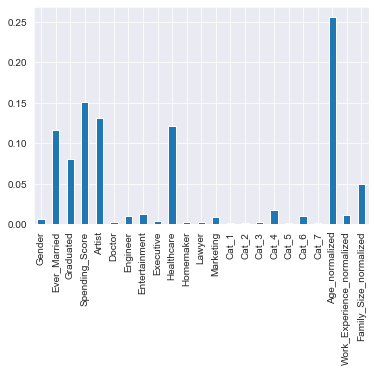

In [1867]:
# result analysis for random forest classifier
# From the feature importance graph, we can see that Age, Ever_Married, Spending_score are the most influential variables
# Artist and Healthcare are also important features. 
# From the previous data exploratary steps, we know that these occupations do vary accross different segmentation
# This feature importance graph makes sense


feature_names = [i for i in X_train.columns]
importances = RF_clf_best.feature_importances_
std = np.std([RF_clf_best.feature_importances_ for tree in RF_clf_best.estimators_], axis=0)

forest_importances = pd.Series(importances, index=feature_names)
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)

# Decision Tree

In [1868]:
from sklearn import tree
import graphviz

In [1869]:
#Prepare for decision tree visualization
feature_idx = range(1,24)
lable_idx=[0]
feature_name = list(train_df.columns[feature_idx])
label_name = ['A','B','C','D']

In [1870]:
# Try parameter criterion='gini'
clf1 = tree.DecisionTreeClassifier(criterion='gini',random_state=42)
clf1.fit(X_train, y_train)
round(clf1.score(X_test, y_test),3)

0.315

In [1871]:
# Print out the decision tree for observation
dot_data1 = tree.export_graphviz(clf1, out_file=None,
                      feature_names=feature_name, 
                      class_names = label_name,
                      filled=True, rounded=True,  
                      special_characters=True
                      )  
graph1 = graphviz.Source(dot_data1)
graph1.render('1')
graph1

## Adjust decision tree model parameter to get a better model with higher score

In [1872]:
# Well,the tree is too wide to show .
# Increase the minimum sample number of leaf nodes. 
clf2 = tree.DecisionTreeClassifier(criterion='gini',random_state=42,min_samples_leaf=90)
clf2.fit(X_train, y_train)
round(clf2.score(X_test, y_test),3)

0.34

In [1873]:
# Increase the minimum sample number of leaf nodes.
clf3 = tree.DecisionTreeClassifier(criterion='gini',random_state=42,min_samples_leaf=100)
clf3.fit(X_train, y_train)
round(clf3.score(X_test, y_test),3)

0.335

We have tried several numbers like, 50, 60, 70. But when the min_samples_leaf=90, we get the highest accuracy. 
When the min_samples_leaf=100, the accuracy was getting decrease.

In [1874]:
# Change the max_depth=None. 
clf4 = tree.DecisionTreeClassifier(criterion='gini',random_state=42,min_samples_leaf=90, max_depth=50)
clf4.fit(X_train, y_train)
round(clf4.score(X_test, y_test),3)

0.34

In [1875]:
clf5 = tree.DecisionTreeClassifier(criterion='gini',random_state=42,min_samples_leaf=90, max_depth=6)
clf5.fit(X_train, y_train)
DTAcc = round(clf5.score(X_test, y_test),3)
DTAcc

0.345

The accuracy was getting increasaed, so we will keep the max_depth=6

In [1876]:
# increase the min_samples_split=5. But there was nothing changed, so we will keep the default.
clf6 = tree.DecisionTreeClassifier(criterion='gini',random_state=42,min_samples_leaf=90, max_depth=6, min_samples_split=5)
clf6.fit(X_train, y_train)
round(clf6.score(X_test, y_test),3)

0.345

In [1877]:
# change the criterion, but the accuracy was decreased.
clf7 = tree.DecisionTreeClassifier(criterion='entropy',random_state=42,min_samples_leaf=90, min_samples_split=5, max_depth=6)
clf7.fit(X_train, y_train)
round(clf7.score(X_test, y_test),3)


0.341

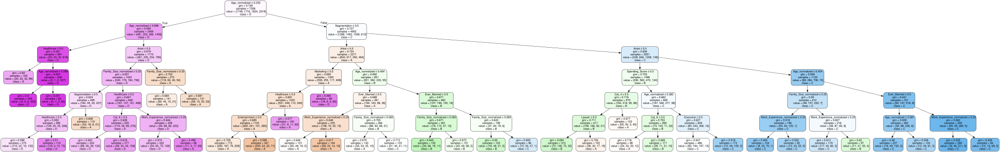

In [1878]:
# In sum, we will keep the clf5 ccriterion='gini',random_state=42,min_samples_leaf=90, max_depth=6 as the final one. 
dot_data2 = tree.export_graphviz(clf5, out_file=None,
                      feature_names=feature_name, 
                      class_names = label_name,
                      filled=True, rounded=True,  
                      special_characters=True)  
graph2 = graphviz.Source(dot_data2)
graph2.render('2')
graph2

## K nearest neighbours

In [1879]:
from sklearn.neighbors import RadiusNeighborsClassifier

In [1880]:
# Try parameter radius = 10
neigh1 = RadiusNeighborsClassifier(radius=10)
neigh1.fit(X_train, y_train)
round(neigh1.score(X_test, y_test),3)

0.294

In [1881]:
# Try to adjust the radius to the minimum value that can be set.
neigh2 = RadiusNeighborsClassifier(radius=3)
neigh2.fit(X_train, y_train)
round(neigh2.score(X_test, y_test),3)

0.299

In [1882]:
# Try to adjust the radius to the minimum value that can be set.
# The minimum value is 1.42. 
# If it is lower than this value, some samples will not be able to find the label.
neigh3 = RadiusNeighborsClassifier(radius=1.42)
neigh3.fit(X_train, y_train)
round(neigh3.score(X_test, y_test),3)

0.321

In [1883]:
#We set radius to 1.44 beacause the test result is the best after continuously adjusting this value
neigh5 = RadiusNeighborsClassifier(radius=1.44)
neigh5.fit(X_train, y_train)
KNAcc = round(neigh5.score(X_test, y_test),3)
KNAcc

0.325

## Model Comparison

In [1884]:
compare = pd.DataFrame({'Model': ['Logistic Regression', 'Random Forest','Decision Tree', 'K Neighbors', ], 
                        'Accuracy': [LRAcc*100, RFAcc*100, DTAcc*100, KNAcc*100,]})
compare.sort_values(by='Accuracy', ascending=False)

,Model,Accuracy
2,Decision Tree,34.5
1,Random Forest,33.6
3,K Neighbors,32.5
0,Logistic Regression,32.4


The highest accuracy model is the decision tree because there are a large number of category in the feature set. 

Our RF’s accuracy score is lower than our DT’s, which potentially mean DT outperforms RF. 

This is possibly because aggregated/ensemble models are not universally better than their "single" counterparts, they are better if and only if the single models suffer of instability (a Machine Learning System that produces large differences in generalization patterns when small changes are made to its initial conditions).

Based on these four accuracy scores we found that 33% is an average score, which is not ideally high.

# Error Analysis 

In [1885]:
from sklearn.metrics import confusion_matrix

In [1886]:
# Using the best performance model as an example
# construct a table with predicted segmentation and actual segmentation
y_pred = clf5.predict(X_test)
result = pd.DataFrame({'y_predicted': y_pred, 'y_actual': y_test})
result.head()


,y_predicted,y_actual
0,0,1
1,1,0
2,3,0
3,2,2
4,0,3


In [1887]:
# We see that the row with index = 0 is inaccurately predicted
# We could access the feature of this instance
X_test.iloc[0]

Gender                        1.000000
Ever_Married                  1.000000
Graduated                     1.000000
Spending_Score                0.000000
Artist                        0.000000
Doctor                        0.000000
Engineer                      1.000000
Entertainment                 0.000000
Executive                     0.000000
Healthcare                    0.000000
Homemaker                     0.000000
Lawyer                        0.000000
Marketing                     0.000000
Cat_1                         0.000000
Cat_2                         0.000000
Cat_3                         0.000000
Cat_4                         0.000000
Cat_5                         0.000000
Cat_6                         1.000000
Cat_7                         0.000000
Age_normalized                0.268657
Work_Experience_normalized    0.000000
Family_Size_normalized        0.000000
Name: 0, dtype: float64

In [1888]:
# Construct a confusion matrix for this model
# We can observe two things:
# 1. a lot of customers belonging to Segment A are mispredicted as segment C or segment D
# 2. segment B has the lowest rate of being predicted corretly
# Because a majority of our testing data belong to segment A (31.9%) where as segment D and Segment C has the highest proportion in training data (27.7% and 24.7%),
# our model do not have enough data to learn about segment A. Hence it's often mispredicted as segment C and segment D.
# Similar reasoning apply for segment B. It has the lowest proportion among all segmentation in the training data (23.3%)

cm = confusion_matrix(y_test, y_pred)
cm_df = pd.DataFrame(cm, index = ['A', 'B', 'C', 'D'], columns=['A', 'B', 'C', 'D'])
cm_df

,A,B,C,D
A,259,91,164,231
B,175,78,139,107
C,131,68,160,60
D,190,63,123,316


We also concluded other possible reasons for misprediction:
1. Lack of data: the amount of data may not capture the complexity of the problem

Solution: acquiring more data of the characteristics of old customers

2. Non-representative data: the newly acquired customers may behave inherently different from the old customers

Solution: using labeled new customer data to predict unlabeled new customer data

3. Irrelevant Features: We may selected irrelevant features. For Decision Tree model, many of our features have importances smaller than 0.1

Solution: Filter out unimportant features. Add other dimension to the data set if possible

4. Algorithm Selection Issue: The choice of four algorithms may also impact the accuracy of the model. Specifically, some more complex algorithms may be better suited this multi-class classification problem.

Solution: Deep learning, Naive Bayes
